# Stitch Electron Microscopy Dataset

Processes a dataset of electron microscopy (EM) image grids, creating stitched images according to the selected
configuration.

In [1]:
%cd ..

import cv2
import matplotlib.pyplot as plt
import os
import re

# Import project definitions.
from src.config.config import get_cfg_defaults
from src.dataset.dataset_loader import DatasetLoader
from src.dataset.demis_loader import DemisLoader
from src.pipeline.demis_stitcher import DemisStitcher
from src.pipeline.image_loader import ImageLoader

/mnt/c/Users/iheiman/Desktop/CODE/demis


## Configure Stitching

In [ ]:
# Prepare configuration.
# cfg_path = "configs/demis-fine-tuned.yaml"
cfg_path = "configs/mist.yaml"
cfg = get_cfg_defaults()
cfg.merge_from_file(cfg_path)
cfg.freeze()

# Stitching configuration.
# selected_grids = [3, 90, 255, 319]  # Use None to stitch all loaded grids.
selected_grids = None
selected_slices = [0]  # Use None to stitch all loaded slices.
plot_output = True
save_output = False

# Check is the DEMIS dataset is in use.
images_path = os.path.join(cfg.DATASET.PATH, "images")
labels_path = os.path.join(cfg.DATASET.PATH, "labels")
# is_demis = (os.path.isdir(images_path) and os.path.isdir(labels_path))
is_demis = False

# Load image paths.
if is_demis:
    loader = DemisLoader(cfg.DATASET.PATH)
    labels = loader.load_labels()
    image_paths = loader.load_paths(labels)
else:
    loader = DatasetLoader(cfg.DATASET.PATH)
    image_paths = loader.load_paths()

# Setup the output directory.
os.makedirs(cfg.STITCHER.OUTPUT_PATH, exist_ok=True)

len(image_paths)

1

## Stitch Using the Configured Stitcher

Stitch image tiles in the selected grids using LoFTR or SIFT (depending on the configuration).

/mnt/c/Users/iheiman/Desktop/CODE/demis/src/pipeline/grid_stitcher.py:47: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  torch.load(cfg.LOFTR.CHECKPOINT_PATH)["state_dict"]
/

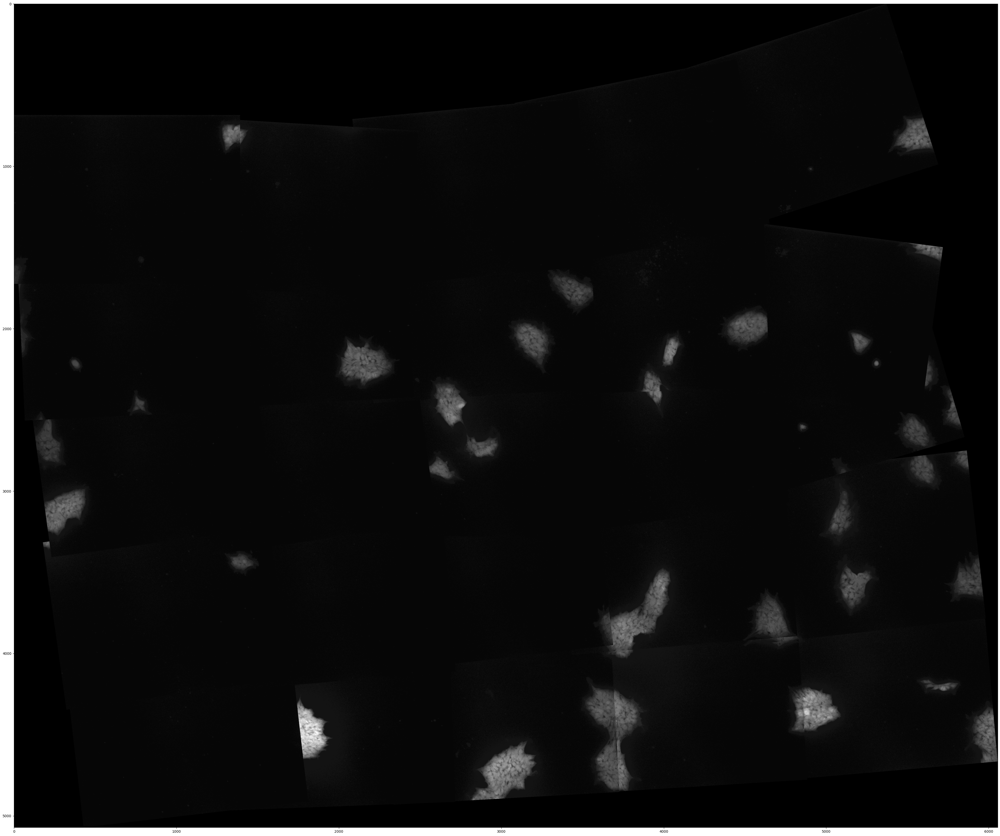

In [ ]:
# Using outdoor_ds.ckpt
img_loader = ImageLoader(cfg)
stitcher = DemisStitcher(cfg, img_loader)
for path_key, tile_paths in image_paths.items():
    grid_index, slice_index = path_key.split("_")
    if ((selected_grids is not None and int(grid_index) not in selected_grids)
            or (selected_slices is not None and int(slice_index) not in selected_slices)):
        continue
    
    # Stitch the grid and save the result.
    stitched_image, _ = stitcher.stitch_grid(tile_paths, f"g{grid_index}_s{slice_index}")
    if save_output:
        out_filename = (f"g{int(grid_index):05d}_s{int(slice_index):05d}"
                        f"_{cfg.STITCHER.MATCHING_METHOD}.png")
        out_path = os.path.join(cfg.STITCHER.OUTPUT_PATH, out_filename)
        cv2.imwrite(out_path, stitched_image)

    # Plot the result if desired.
    if plot_output:
        fig = plt.figure(figsize=(50, 50))
        if cfg.STITCHER.COLORED_OUTPUT:
            plt.imshow(stitched_image)
        else:
            plt.imshow(stitched_image, cmap="gray")

/mnt/c/Users/iheiman/Desktop/CODE/demis/src/pipeline/grid_stitcher.py:47: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  torch.load(cfg.LOFTR.CHECKPOINT_PATH)["state_dict"]


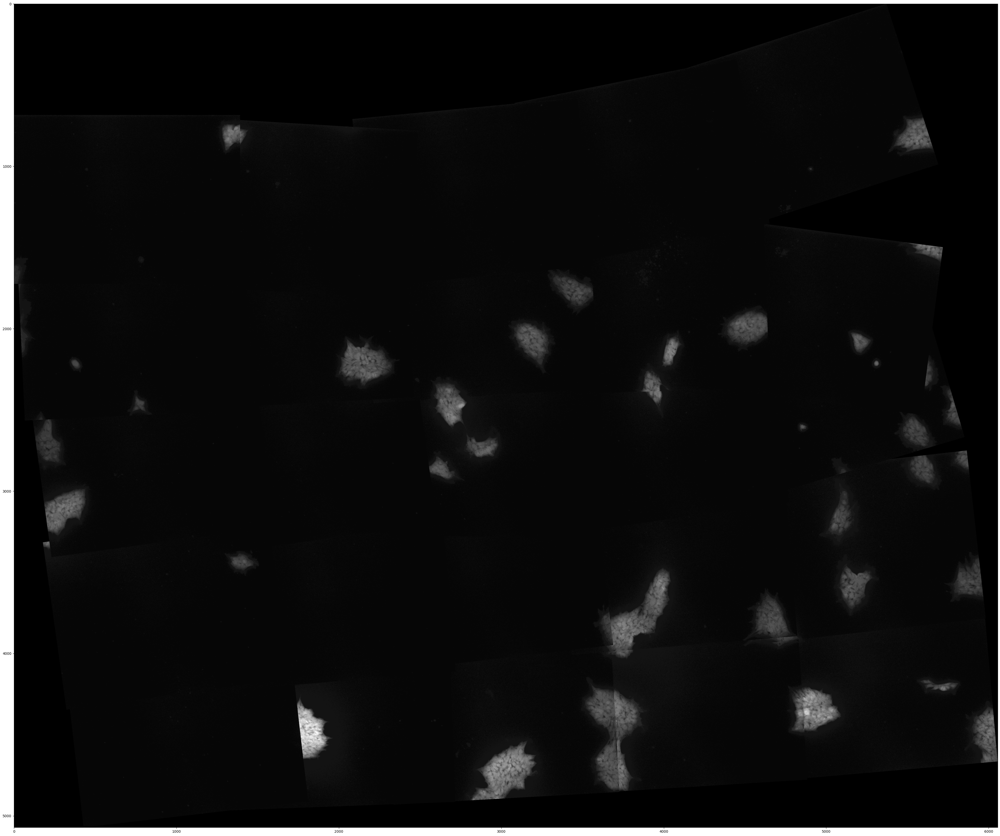

In [7]:
# Using demis.ckpt
# Prepare configuration.
# cfg_path = "configs/demis-fine-tuned.yaml"
cfg_path = "configs/mist_demis_ckpt.yaml"
cfg = get_cfg_defaults()
cfg.merge_from_file(cfg_path)
cfg.freeze()

# Stitching configuration.
# selected_grids = [3, 90, 255, 319]  # Use None to stitch all loaded grids.
selected_grids = None
selected_slices = [0]  # Use None to stitch all loaded slices.
plot_output = True
save_output = False

# Check is the DEMIS dataset is in use.
images_path = os.path.join(cfg.DATASET.PATH, "images")
labels_path = os.path.join(cfg.DATASET.PATH, "labels")
# is_demis = (os.path.isdir(images_path) and os.path.isdir(labels_path))
is_demis = False

# Load image paths.
if is_demis:
    loader = DemisLoader(cfg.DATASET.PATH)
    labels = loader.load_labels()
    image_paths = loader.load_paths(labels)
else:
    loader = DatasetLoader(cfg.DATASET.PATH)
    image_paths = loader.load_paths()

# Setup the output directory.
os.makedirs(cfg.STITCHER.OUTPUT_PATH, exist_ok=True)

len(image_paths)
img_loader = ImageLoader(cfg)
stitcher = DemisStitcher(cfg, img_loader)
for path_key, tile_paths in image_paths.items():
    grid_index, slice_index = path_key.split("_")
    if ((selected_grids is not None and int(grid_index) not in selected_grids)
            or (selected_slices is not None and int(slice_index) not in selected_slices)):
        continue
    
    # Stitch the grid and save the result.
    stitched_image, _ = stitcher.stitch_grid(tile_paths, f"g{grid_index}_s{slice_index}")
    if save_output:
        out_filename = (f"g{int(grid_index):05d}_s{int(slice_index):05d}"
                        f"_{cfg.STITCHER.MATCHING_METHOD}.png")
        out_path = os.path.join(cfg.STITCHER.OUTPUT_PATH, out_filename)
        cv2.imwrite(out_path, stitched_image)

    # Plot the result if desired.
    if plot_output:
        fig = plt.figure(figsize=(50, 50))
        if cfg.STITCHER.COLORED_OUTPUT:
            plt.imshow(stitched_image)
        else:
            plt.imshow(stitched_image, cmap="gray")

## Stitch Using DEMIS Labels

If processing the DEMIS dataset, stitch image tiles in the selected grids using DEMIS labels.

In [ ]:
if is_demis:
    for grid_labels in labels:
        match = re.search(r"g(\d+)", os.path.basename(grid_labels["path"]))
        if match is None:
            raise ValueError(f"Cannot parse labels file name: {grid_labels['path']}.")
        grid_index = int(match.groups()[0])
        slice_index = 0  # The DEMIS dataset has no slices.
        if ((selected_grids is not None and int(grid_index) not in selected_grids)
                or (selected_slices is not None and slice_index not in selected_slices)):
            continue
        
        # Stitch the grid and save the result.
        stitched_image, _ = stitcher.stitch_demis_grid_mst(grid_labels)
        if save_output:
            out_filename = f"g{int(grid_index):05d}_s00000_demis.png"
            out_path = os.path.join(cfg.STITCHER.OUTPUT_PATH, out_filename)
            cv2.imwrite(out_path, stitched_image)

        # Plot the result if desired.
        if plot_output:
            fig = plt.figure(figsize=(50, 50))
            if cfg.STITCHER.COLORED_OUTPUT:
                plt.imshow(stitched_image)
            else:
                plt.imshow(stitched_image, cmap="gray")